In [1]:
%load_ext autoreload
%autoreload 2

import os
from datetime import datetime
from time import time
# import dill
import pickle
import glob
import importlib
import numpy as np
import scipy as sp
import scipy.misc
import pandas as pd
import re
import itertools
from scanf import scanf
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.ticker as mtick
from matplotlib import colors as mcolors
from matplotlib.colors import ListedColormap, BoundaryNorm, PowerNorm, Normalize
from mpl_toolkits.mplot3d import axes3d, Axes3D
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate, integrate, optimize, sparse
from scipy.interpolate import interp1d, interp2d
from IPython.display import display, HTML, Math
from scipy import interpolate
from tqdm.notebook import tqdm as tqdm_notebook

from src import slenderBodyTheory as slb
from src.geo import *
from src.objComposite import *
from codeStore import support_fun as spf
from codeStore.support_fun_head_tail import *
from codeStore.support_fun_tail_rotate import *

PWD = os.getcwd()
np.set_printoptions(linewidth=110, precision=5)

params = {'animation.html': 'html5',
          'font.family':    'sans-serif',
          'font.size':      15, }
preamble = r' '
preamble = preamble + '\\usepackage{bm} '
preamble = preamble + '\\usepackage{amsmath} '
preamble = preamble + '\\usepackage{amssymb} '
preamble = preamble + '\\usepackage{mathrsfs} '
preamble = preamble + '\\DeclareMathOperator{\\Tr}{Tr} '
preamble = preamble + '\\newcommand{\\norm}[1]{\\left\\lVert#1\\right\\rVert}'
params['text.latex.preamble'] = preamble
params['text.usetex'] = True
plt.rcParams.update(params)


In [2]:
def wrapper_SLB_ft(fgeo, force, problem_kwargs):
    arc_ft = force.reshape((-1, fgeo.get_dof()))
    arc_x = fgeo.s_list / fgeo.arclength(0) * fgeo.ph
    return arc_x, arc_ft

In [107]:
job_dir = 'hlxPart_SLB'
# pickle_name = 'ph6.5000_ch10.0000.pickle'
pickle_name = 'ph6.5000_ch800.0000.pickle'

pickle_path = os.path.join(PWD, job_dir, pickle_name)
with open(pickle_path, 'rb') as handle:
    tpickle = pickle.load(handle)
    problem_kwargs, At, Bt1, Bt2, Ct, f_tran_list, f_rot_list, geo_info = tpickle
fgeo = geo_info[0]
ph = problem_kwargs['ph']
ch = problem_kwargs['ch']
rt = problem_kwargs['rh1']

## analyze force distributions due to translation, center part

Text(0.5, 0.92, '$\\bm{f}^z$')

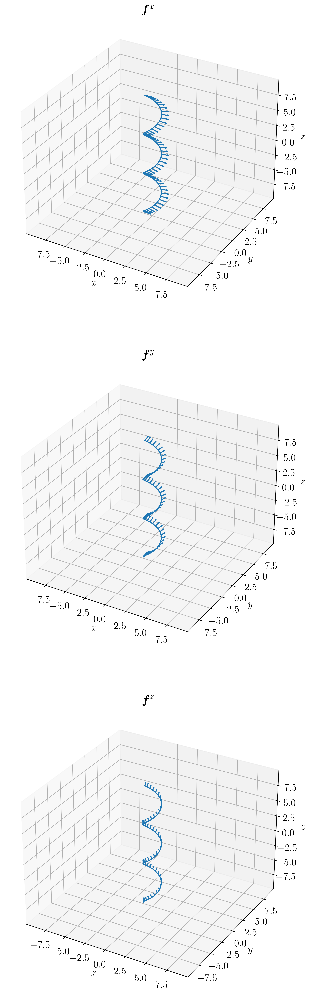

In [4]:
# show force distribution associated with $\\mathbb{A}^v_{00}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((3, 9)) * 3
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -1.5, ph * 1.5
# arc_min, arc_max = -np.inf, np.inf


fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, subplot_kw={'projection': '3d'})
fig.patch.set_facecolor('white')
#
axi = axs[0]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[0][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
# for i0 in range(quiver_each - 1):
#     tidx[i0::quiver_each] = False
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^x$')
#
axi = axs[1]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[1][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^y$')
#
axi = axs[2]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[2][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^z$')


initial guess [0.04611906983691496, 0.8402910909339154]
fit_AFx [0.07492 0.84029]
initial guess [0.048492397274942936]
fit_AFy [0.07492]
initial guess [0.15450599400170112]
fit_AFz [0.2417]


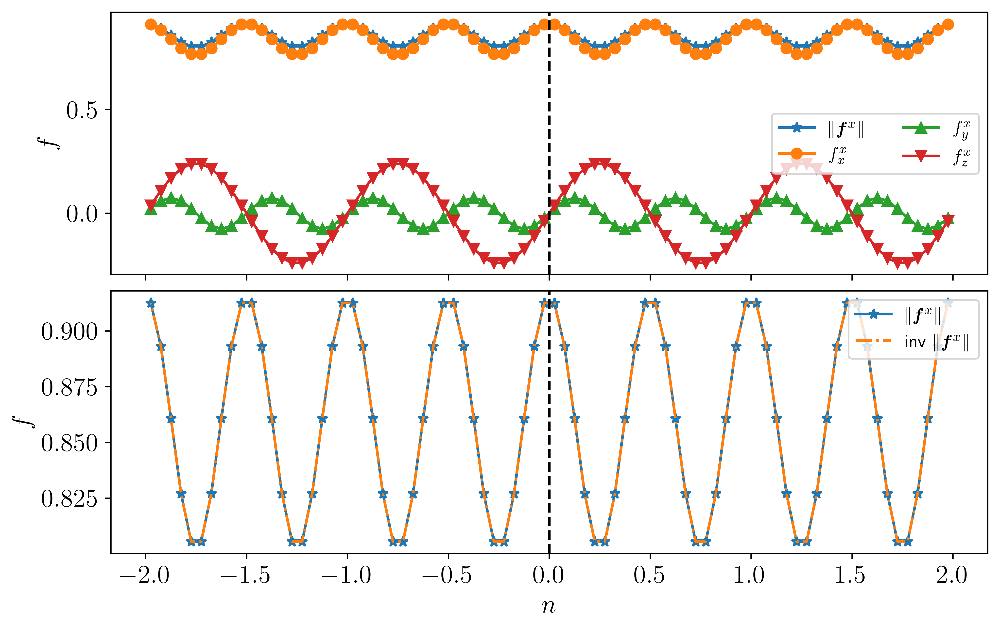

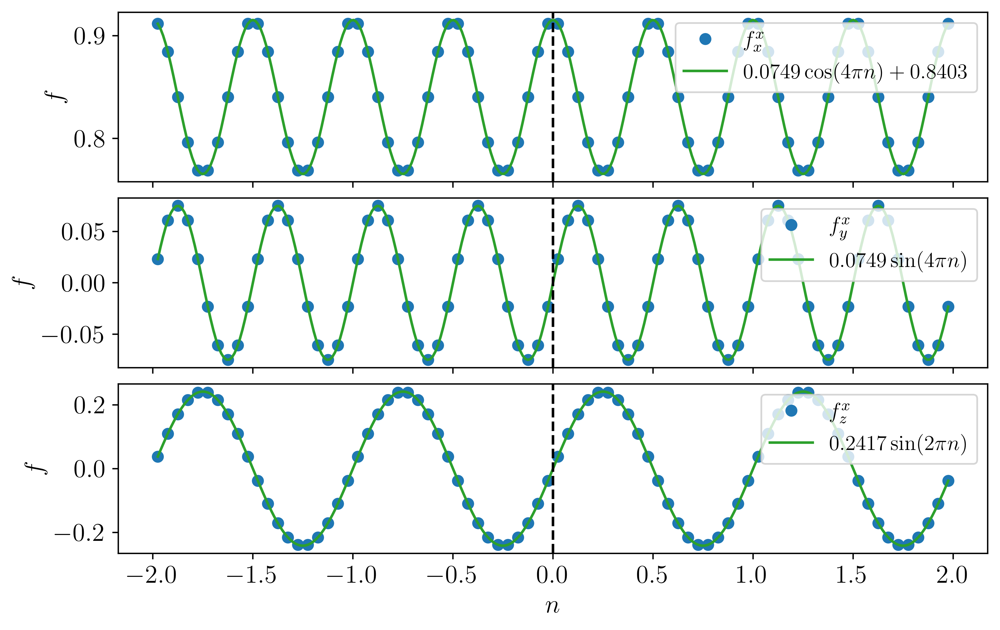

In [5]:
# show and fit force distribution associated with $\\mathbb{A}^v_{00}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 1

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[0][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

################################################################################
fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# show all components 
axi = axs[0]
axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^x}$')
axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^x_x$')
axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^x_y$')
axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^x_z$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(ncol=2, fontsize='x-small')
#
# test symmetricity, norm
axi = axs[1]
axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^x}$')
axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
         label='inv $\\norm{\\bm{f}^x}$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, a0, b):
    y = a0 * np.cos(4 * np.pi * x) + b
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), np.mean(ty), ]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, 'oC0', markevery=markevery, label='$f^x_x$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^x_x$')
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
         label='$%.4f \\cos (4 \\pi n) + %.4f$' % (fit_AFx[0], fit_AFx[1]))
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fy
def func_AFy(x, a0):
    y = a0 * np.sin(4 * np.pi * x)
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^x_y$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_y$')
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
         label='$%.4f \\sin (4 \\pi n)$' % fit_AFy)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fz
def func_AFz(x, a0):
    y = a0 * np.sin(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 2]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^x_z$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_z$')
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
         label='$%.4f \\sin (2 \\pi n)$' % fit_AFz)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')


initial guess [0.04849231794894199]
fit_AFx [0.07492]
initial guess [0.046119083206244214, 0.8402897505528752]
fit_AFy [0.07492 0.84029]
initial guess [0.1545057430736466]
fit_AFz [0.2417]


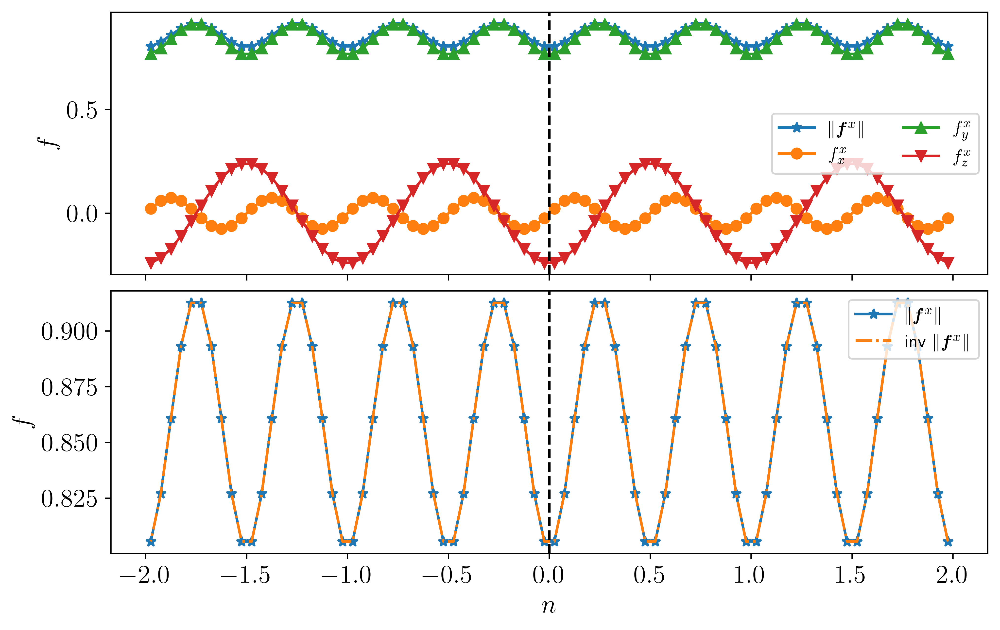

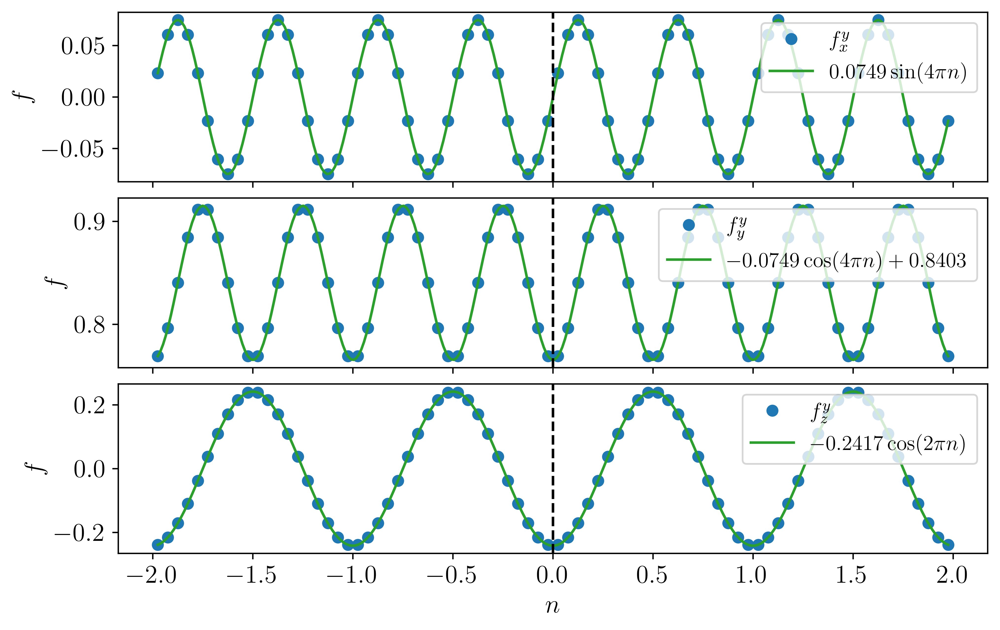

In [6]:
# show and fit force distribution associated with $\\mathbb{A}^v_{11}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 1

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[1][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

################################################################################
fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# show all components 
axi = axs[0]
axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^x}$')
axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^x_x$')
axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^x_y$')
axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^x_z$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(ncol=2, fontsize='x-small')
#
# test symmetricity, norm
axi = axs[1]
axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^x}$')
axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
         label='inv $\\norm{\\bm{f}^x}$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, a0):
    y = a0 * np.sin(4 * np.pi * x)
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, 'oC0', markevery=markevery, label='$f^y_x$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^y_x$')
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
         label='$%.4f \\sin (4 \\pi n)$' % fit_AFx)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fy
def func_AFy(x, a0, b):
    y = -a0 * np.cos(4 * np.pi * x) + b
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))), np.mean(np.abs(ty)), ]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^y_y$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^y_y$')
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
         label='$-%.4f \\cos (4 \\pi n) + %.4f$' % (fit_AFy[0], fit_AFy[1]))
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fz
def func_AFz(x, a0):
    y = -a0 * np.cos(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 2]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^y_z$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^y_z$')
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
         label='$-%.4f \\cos (2 \\pi n)$' % fit_AFz)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')


initial guess [0.08660137083730543]
fit_AFx [0.13547]
initial guess [0.08660137253382741]
fit_AFy [0.13547]
initial guess [0.5028133552536816]
fit_AFz [0.50281]


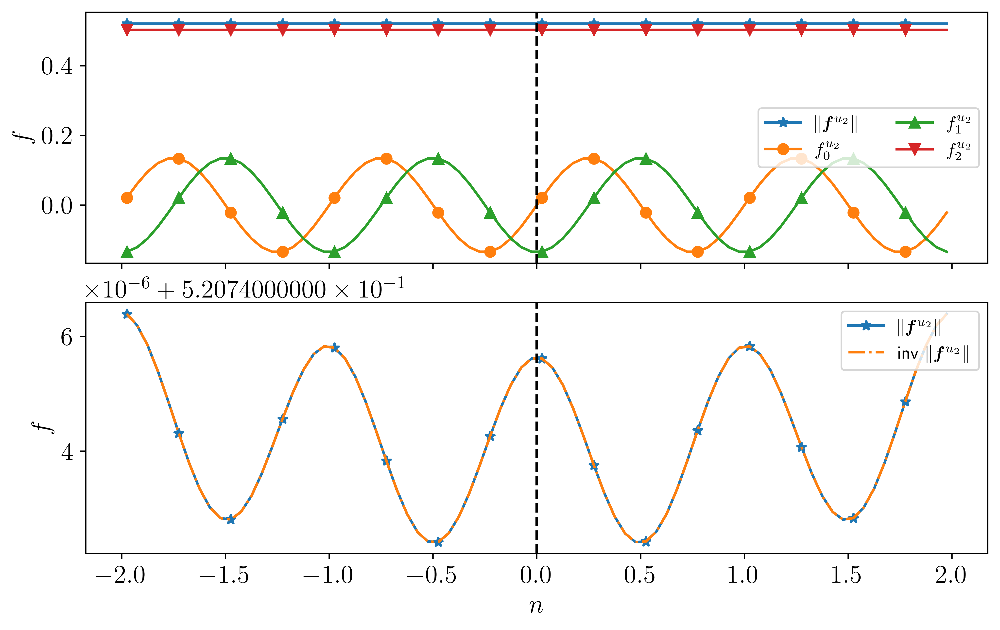

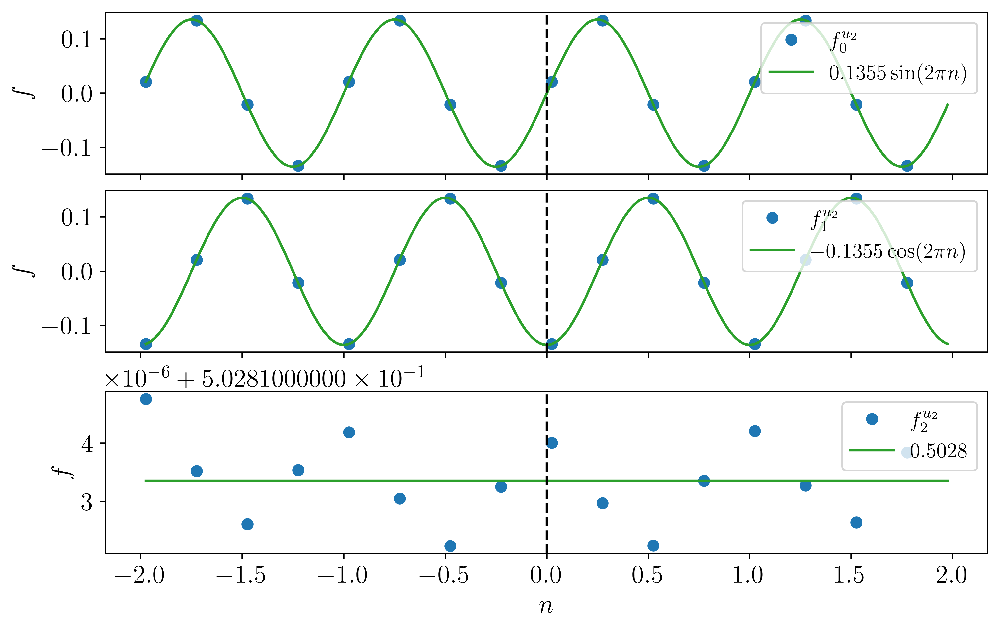

In [7]:
# show and fit force distribution associated with $\\mathbb{A}^v_{22}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 5

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[2][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

################################################################################
fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# show all components 
axi = axs[0]
axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^{u_2}}$')
axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^{u_2}_0$')
axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^{u_2}_1$')
axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^{u_2}_2$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(ncol=2, fontsize='x-small')
#
# test symmetricity, norm
axi = axs[1]
axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^{u_2}}$')
axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
         label='inv $\\norm{\\bm{f}^{u_2}}$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, a0):
    y = a0 * np.sin(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, 'oC0', markevery=markevery, label='$f^{u_2}_0$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^{u_2}_0$')
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
         label='$%.4f \\sin (2 \\pi n)$' % fit_AFx)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fy
def func_AFy(x, a0):
    y = -a0 * np.cos(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^{u_2}_1$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^{u_2}_1$')
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
         label='$-%.4f \\cos (2 \\pi n)$' % fit_AFy)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
#
# test symmetricity, Fz
def func_AFz(x, a0):
    y = a0 * np.ones_like(x)
    return y
ty = arc_ft[tidx, 2]
p0 = [np.mean(ty), ]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  'oC0', markevery=markevery, label='$f^{u_2}_2$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^{u_2}_2$')
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
         label='$%.4f$' % fit_AFz)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')


## analyze force distributions due to rotation, center part

Text(0.5, 0.92, '$\\bm{f}^{\\omega_2}$')

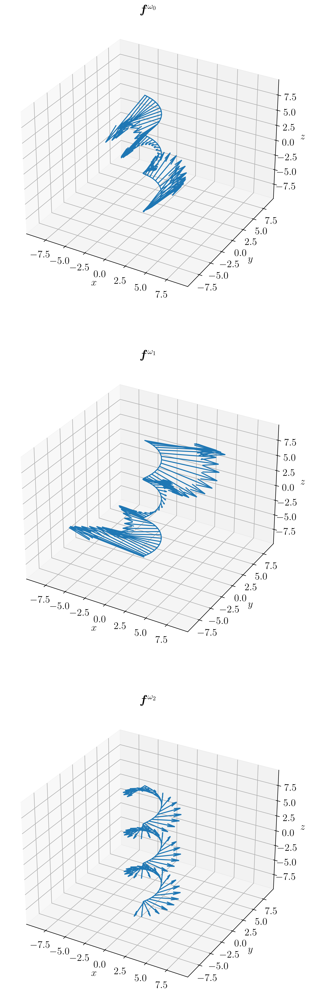

In [8]:
# show force distribution associated with $\\mathbb{A}^v_{00}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((3, 9)) * 3
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
quiver_each = 10
arc_min, arc_max = ph * -1.5, ph * 1.5


fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, subplot_kw={'projection': '3d'})
fig.patch.set_facecolor('white')
#
axi = axs[0]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[0][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^{\\omega_0}$')
#
axi = axs[1]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[1][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^{\\omega_1}$')
#
axi = axs[2]
arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[2][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
axi.plot(*fgeo.get_nodes()[tidx].T)
axi.quiver(*fgeo.get_nodes()[tidx].T, *arc_ft[tidx, :3].T)
spf.set_axes_equal(axi)
axi.set_xlabel('$x$')
axi.set_ylabel('$y$')
axi.set_zlabel('$z$')
axi.set_title('$\\bm{f}^{\\omega_2}$')


initial guess [0.35914187905870676, -0.03248661473893884, 0]
fit_AFx [0.0826  0.32793 0.23988]
initial guess [6.021128493436613, 0, 0]
fit_AFy [0.0826  0.92633 0.32793]
initial guess [0, 1.2622490120314738]
fit_AFz [0.26645 0.86599]


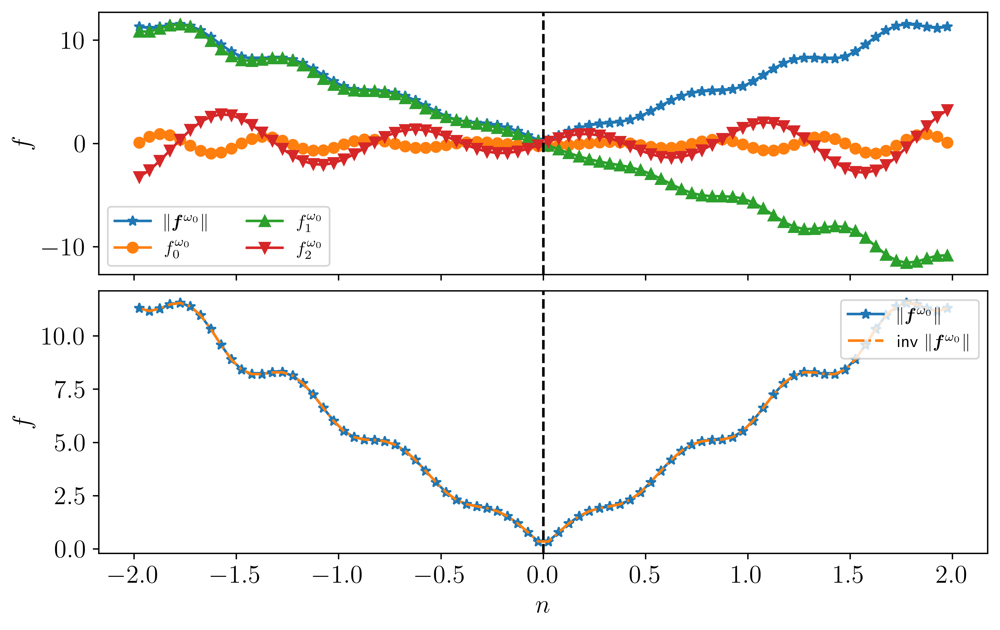

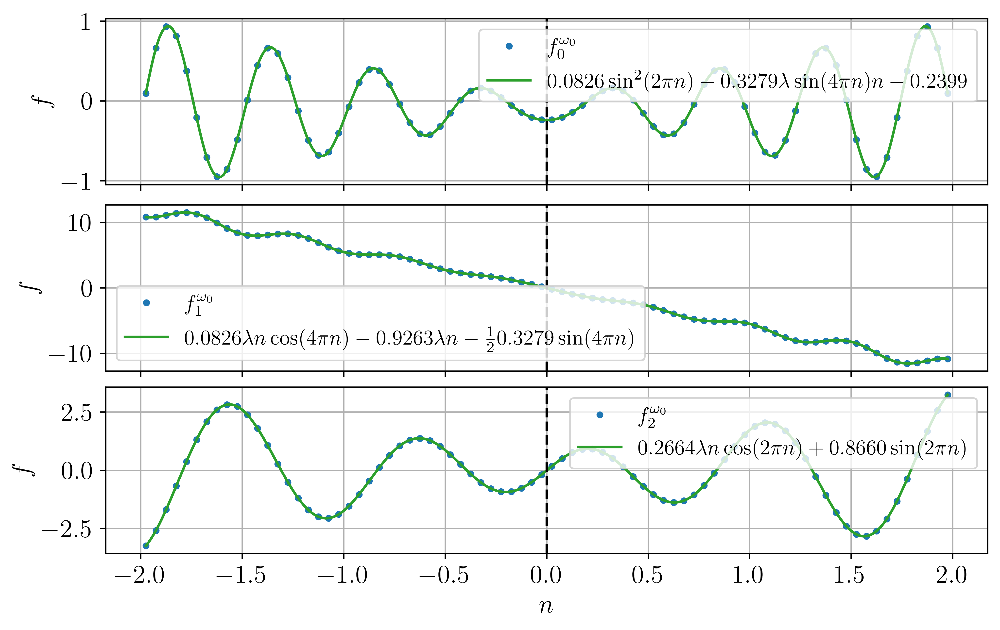

In [9]:
# show and fit force distribution associated with $\\mathbb{C}^v_{00}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 1

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[0][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

################################################################################
fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# show all components 
axi = axs[0]
axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^{\\omega_0}}$')
axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^{\\omega_0}_0$')
axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^{\\omega_0}_1$')
axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^{\\omega_0}_2$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(ncol=2, fontsize='x-small')
#
# test symmetricity, norm
axi = axs[1]
axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
         label='$\\norm{\\bm{f}^{\\omega_0}}$')
axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
         label='inv $\\norm{\\bm{f}^{\\omega_0}}$')
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, k0, k2, k5):
    y = k2 * np.sin(2 * np.pi * x) ** 2 - k0 * ph * x * np.sin(4 * np.pi * x) - k5
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), np.mean(ty), 0]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, '.C0', markevery=markevery, label='$f^{\\omega_0}_0$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^{\\omega_0}_0$')
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
         label='$%.4f \\sin^2 (2 \\pi n) -%.4f \\lambda \\sin (4 \\pi n) n - %.4f$' % (fit_AFx[0], fit_AFx[1], fit_AFx[2]))
# axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fy
def func_AFy(x, k0, k1, k2):
    y = k0 * ph * x *np.cos(4 * np.pi * x) - k1 * ph * x - 1 / 2 * k2 * np.sin(4 * np.pi * x)
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))), 0, 0]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^{\\omega_0}_1$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^{\\omega_0}_1$')
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
         label='$%.4f \\lambda n \\cos (4 \\pi n) - %.4f \\lambda n - \\frac{1}{2} %.4f \\sin (4 \\pi n)$' % (fit_AFy[0], fit_AFy[1], fit_AFy[2]))
# axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='lower left', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fz
def func_AFz(x, k3, k4):
    y = k3 * ph * x * np.cos(2 * np.pi * x) + k4 * np.sin(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 2]
p0 = [0, np.mean(np.abs(ty - np.mean(ty)))]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^{\\omega_0}_2$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^{\\omega_0}_2$')
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
         label='$%.4f \\lambda n \\cos (2 \\pi n) + %.4f \\sin (2 \\pi n)$' % (fit_AFz[0], fit_AFz[1]))
# axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()


initial guess [6.021139114538906, 0]
fit_AFx [0.08345 0.92772]
initial guess [0.35908375028733924, 0, 0]
fit_AFy [-0.32646 -0.08277  0.09615]
initial guess [0, 1.3040116965828048]
fit_AFz [0.26552 0.86901]


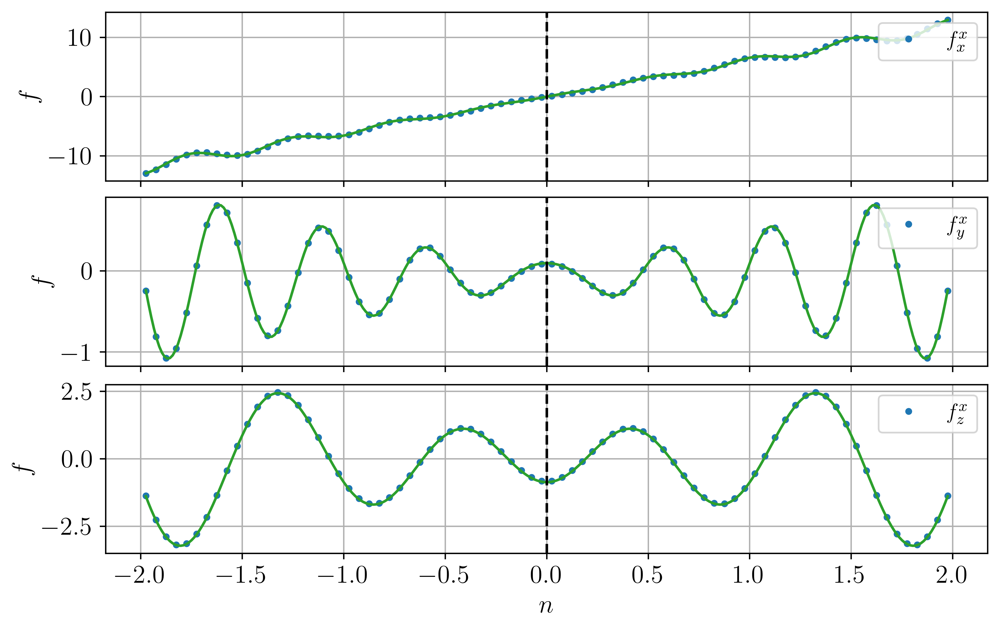

In [10]:
# show and fit force distribution associated with $\\mathbb{C}^v_{11}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 1

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[1][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

# ################################################################################
# fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
# fig.patch.set_facecolor('white')
# axs[-1].set_xlabel('$n$')
# #
# # show all components 
# axi = axs[0]
# axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
#          label='$\\norm{\\bm{f}^x}$')
# axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^x_x$')
# axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^x_y$')
# axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^x_z$')
# axi.axvline(0, ls='--', c='k')
# axi.set_ylabel('$f$')
# axi.legend(ncol=2, fontsize='x-small')
# #
# # test symmetricity, norm
# axi = axs[1]
# axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
#          label='$\\norm{\\bm{f}^x}$')
# axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
#          label='inv $\\norm{\\bm{f}^x}$')
# axi.axvline(0, ls='--', c='k')
# axi.set_ylabel('$f$')
# axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, a0, a1,):
    y = ph * x * (a1 + a0 * np.cos(4 * np.pi * x)) - 1 / 2 * 0 * np.sin(4 * np.pi * x)
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), 0, ]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, '.C0', markevery=markevery, label='$f^x_x$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^x_x$')
# axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
#          label='$%.4f n \\sin (4 \\pi n) + %.4f$' % (fit_AFx[0], fit_AFx[1]))
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fy
def func_AFy(x, k2, k0, k5):
    y = k2 * np.sin(2 * np.pi * x) ** 2 - k0 * ph * x * np.sin(4 * np.pi * x) + k5
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))), 0, 0]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^x_y$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_y$')
# axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
#          label='$%.4f n \\cos (4 \\pi n) + %.4f n$' % (fit_AFy[0], fit_AFy[1]))
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fz
def func_AFz(x, k3, k4):
    y = -k4 * np.cos(2 * np.pi * x) + k3 * ph * x * np.sin(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 2]
p0 = [0, np.mean(np.abs(ty - np.mean(ty)))]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^x_z$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_z$')
# axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
#          label='$%.4f n \\cos (2 \\pi n)$' % fit_AFz)
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()


initial guess [1.8877867693608394]
fit_AFx [2.95315]
initial guess [1.8877868082697025]
fit_AFy [2.95315]
initial guess [0.13466221081741014]
fit_AFz [0.13466]


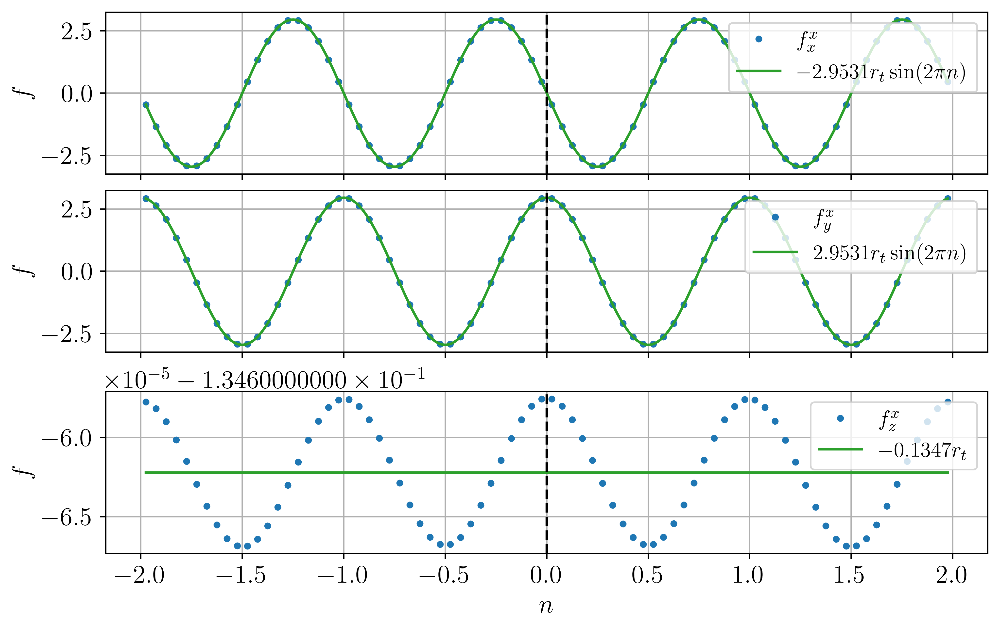

In [11]:
# show and fit force distribution associated with $\\mathbb{C}^v_{11}$

# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 15})
figsize=np.array((16, 10)) * 0.5
dpi = 500 if 'inline' in matplotlib.get_backend() else 100
arc_min, arc_max = ph * -2, ph * 2
markevery = 1

arc_x, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[2][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx] / ph
fit_x = np.linspace(tx.min(), tx.max(), 300)

# ################################################################################
# fig, axs = plt.subplots(2, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
# fig.patch.set_facecolor('white')
# axs[-1].set_xlabel('$n$')
# #
# # show all components 
# axi = axs[0]
# axi.plot(tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
#          label='$\\norm{\\bm{f}^x}$')
# axi.plot(tx, arc_ft[tidx, 0], 'o-C1', markevery=markevery, label='$f^x_x$')
# axi.plot(tx, arc_ft[tidx, 1], '^-C2', markevery=markevery, label='$f^x_y$')
# axi.plot(tx, arc_ft[tidx, 2], 'v-C3', markevery=markevery, label='$f^x_z$')
# axi.axvline(0, ls='--', c='k')
# axi.set_ylabel('$f$')
# axi.legend(ncol=2, fontsize='x-small')
# #
# # test symmetricity, norm
# axi = axs[1]
# axi.plot(tx,  np.linalg.norm(arc_ft[tidx, :3], axis=-1), '*-C0', markevery=markevery, 
#          label='$\\norm{\\bm{f}^x}$')
# axi.plot(-tx, np.linalg.norm(arc_ft[tidx, :3], axis=-1), '-.C1', markevery=markevery, 
#          label='inv $\\norm{\\bm{f}^x}$')
# axi.axvline(0, ls='--', c='k')
# axi.set_ylabel('$f$')
# axi.legend(loc='upper right', ncol=1, fontsize='x-small')

################################################################################
fig, axs = plt.subplots(3, 1, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs[-1].set_xlabel('$n$')
#
# test symmetricity, Fx
def func_AFx(x, k6):
    y = -k6 * rt * np.sin(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 0]
p0 = [np.mean(np.abs(ty - np.mean(ty))), ]
fit_AFx, pcov = curve_fit(func_AFx, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFx', fit_AFx)

axi = axs[0]
axi.plot(tx,  ty, '.C0', markevery=markevery, label='$f^x_x$')
# axi.plot(-tx, ty, 'sC1', markevery=markevery, label='inv $f^x_x$')
axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery, 
         label='$-%.4f r_t \\sin (2 \\pi n)$' % (fit_AFx))
# axi.plot(fit_x, func_AFx(fit_x, *fit_AFx), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fy
def func_AFy(x, k6):
    y = k6 * rt * np.cos(2 * np.pi * x)
    return y
ty = arc_ft[tidx, 1]
p0 = [np.mean(np.abs(ty - np.mean(ty))),]
fit_AFy, pcov = curve_fit(func_AFy, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFy', fit_AFy)

axi = axs[1]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^x_y$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_y$')
axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery, 
         label='$%.4f r_t \\sin (2 \\pi n)$' % (fit_AFy))
# axi.plot(fit_x, func_AFy(fit_x, *fit_AFy), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()
#
# test symmetricity, Fz
def func_AFz(x, k3):
    y = -k3 * rt * np.ones_like(x)
    return y
ty = arc_ft[tidx, 2]
p0 = [-np.mean(ty), ]
fit_AFz, pcov = curve_fit(func_AFz, tx, ty, p0=p0)
print('initial guess', p0)
print('fit_AFz', fit_AFz)

axi = axs[2]
axi.plot(tx,  ty,  '.C0', markevery=markevery, label='$f^x_z$')
# axi.plot(-tx, -ty, 'sC1', markevery=markevery, label='inv $-f^x_z$')
axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery, 
         label='$-%.4f r_t$' % fit_AFz)
# axi.plot(fit_x, func_AFz(fit_x, *fit_AFz), '-C2', markevery=markevery)
axi.axvline(0, ls='--', c='k')
axi.set_ylabel('$f$')
axi.legend(loc='upper right', ncol=1, fontsize='small')
axi.grid()


1218.7657132932595 1223.4056662189964
-3.725290298461914e-09 -9.313225746154785e-09
-3.6202152386977104e-12 -7.270628543665225e-12
2.421438694000244e-08 2.9802322387695312e-08
-199.11945700945392 -194.47918196794888
2.604027762859685 2.6077705328385066
6.093614501878619e-11 -3.4276581573067233e-10
-3343.359057593294 -3347.457055835436
-2253.7749799485127 -2267.453328156418


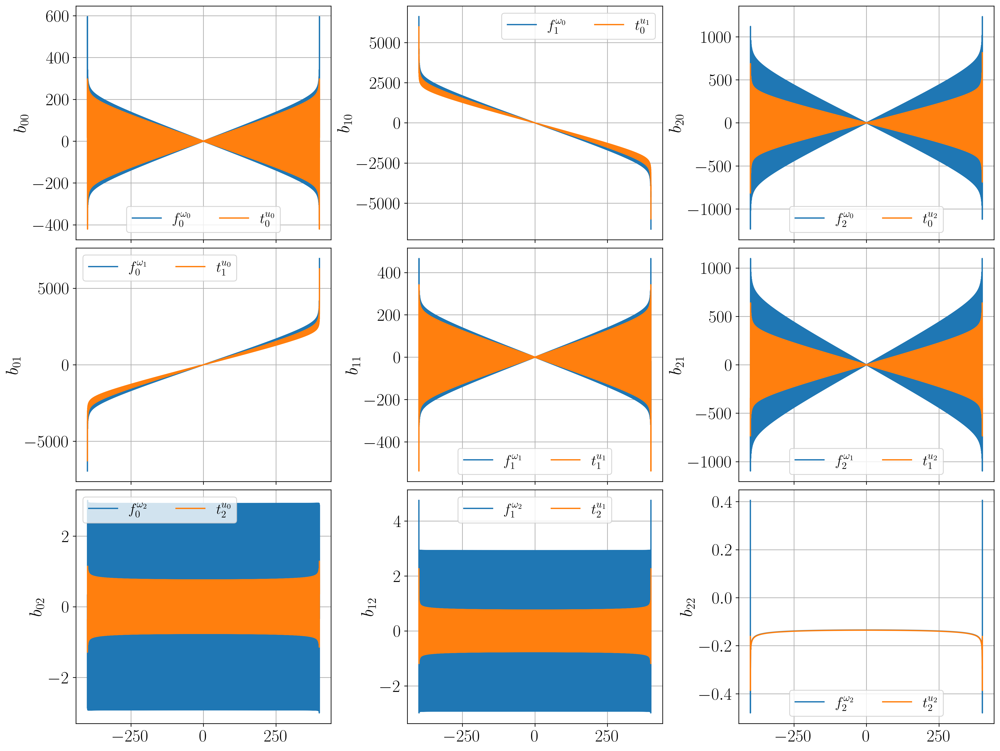

In [108]:
plt.rcParams.update({'font.size': 20})
figsize=np.array((16, 12)) * 1
dpi = 300 if 'inline' in matplotlib.get_backend() else 100
# arc_min, arc_max = ph * -2, ph * 2
arc_min, arc_max = ph * -np.inf, ph * np.inf

arc_x, _ = wrapper_SLB_ft(fgeo, f_tran_list[0][0], problem_kwargs)
tidx = (arc_x > arc_min) * (arc_x < arc_max)
tx = arc_x[tidx]
rhlx = fgeo.get_nodes()[tidx]

# u_0
_, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[0][0], problem_kwargs)
fu0 = arc_ft[tidx, :3]
tu0 = np.cross(rhlx, fu0)
# u_1
_, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[1][0], problem_kwargs)
fu1 = arc_ft[tidx, :3]
tu1 = np.cross(rhlx, fu1)
# u_2
_, arc_ft = wrapper_SLB_ft(fgeo, f_tran_list[2][0], problem_kwargs)
fu2 = arc_ft[tidx, :3]
tu2 = np.cross(rhlx, fu2)
# w_0
_, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[0][0], problem_kwargs)
fw0 = arc_ft[tidx, :3]
tw0 = np.cross(rhlx, fw0)
# w_1
_, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[1][0], problem_kwargs)
fw1 = arc_ft[tidx, :3]
tw1 = np.cross(rhlx, fw1)
# w_2
_, arc_ft = wrapper_SLB_ft(fgeo, f_rot_list[2][0], problem_kwargs)
fw2 = arc_ft[tidx, :3]
tw2 = np.cross(rhlx, fw2)

# #----------------------------------------------------------#
fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
axs = axs.T.ravel()
# b^1
for _ in zip(axs, 
            (fw0[:, 0], fw1[:, 0], fw2[:, 0], 
             fw0[:, 1], fw1[:, 1], fw2[:, 1], 
             fw0[:, 2], fw1[:, 2], fw2[:, 2], ), 
            ('$f_0^{\\omega_0}$', '$f_0^{\\omega_1}$', '$f_0^{\\omega_2}$', 
             '$f_1^{\\omega_0}$', '$f_1^{\\omega_1}$', '$f_1^{\\omega_2}$', 
             '$f_2^{\\omega_0}$', '$f_2^{\\omega_1}$', '$f_2^{\\omega_2}$', ), 
            (tu0[:, 0], tu0[:, 1], tu0[:, 2], 
             tu1[:, 0], tu1[:, 1], tu1[:, 2], 
             tu2[:, 0], tu2[:, 1], tu2[:, 2], ), 
            ('$t_0^{u_0}$', '$t_1^{u_0}$', '$t_2^{u_0}$', 
             '$t_0^{u_1}$', '$t_1^{u_1}$', '$t_2^{u_1}$', 
             '$t_0^{u_2}$', '$t_1^{u_2}$', '$t_2^{u_2}$', ), 
            ('$b_{00}$', '$b_{01}$', '$b_{02}$', 
             '$b_{10}$', '$b_{11}$', '$b_{12}$', 
             '$b_{20}$', '$b_{21}$', '$b_{22}$', ), ):
    axi, ty1, lab1, ty2, lab2, ylabel = _
    axi.plot(tx / ph, ty1, label=lab1)
    axi.plot(tx / ph, ty2, label=lab2)
    axi.set_ylabel(ylabel)
    axi.legend(ncol=2, fontsize='small')
    axi.grid()
    print(ty1.sum(), ty2.sum())


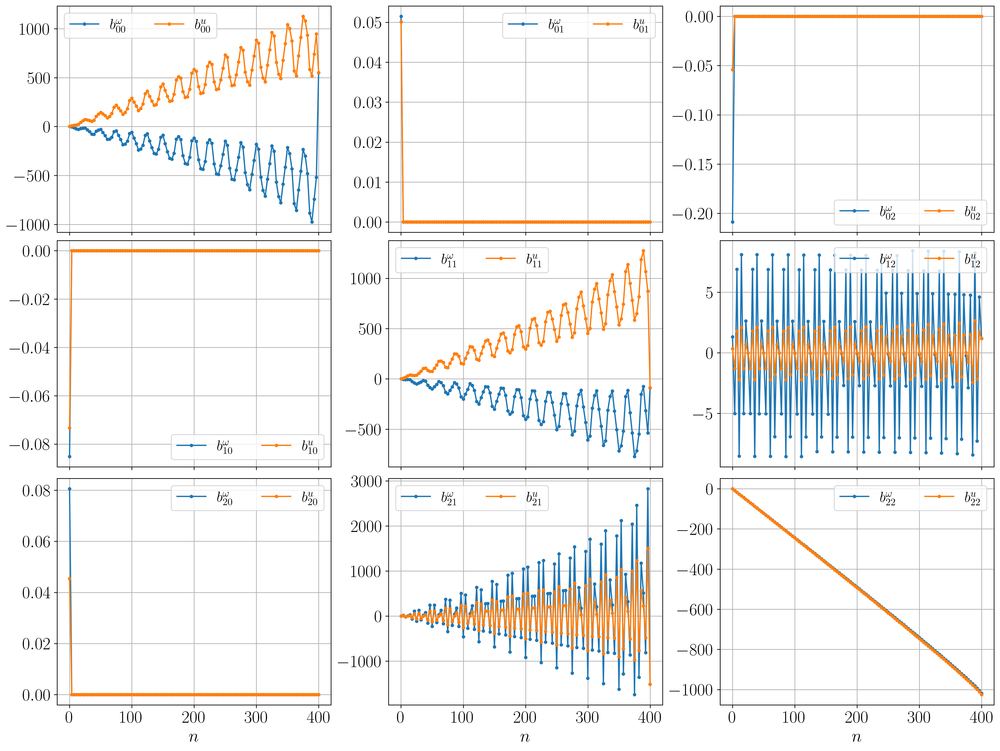

In [122]:
# %matplotlib notebook
%matplotlib inline

plt.rcParams.update({'font.size': 20})
figsize=np.array((16, 12)) * 1
dpi = 300 if 'inline' in matplotlib.get_backend() else 100

arc_x, _ = wrapper_SLB_ft(fgeo, f_tran_list[0][0], problem_kwargs)
inta_ij = [[[], [], []], [[], [], []], [[], [], []]]
intb1_ij = [[[], [], []], [[], [], []], [[], [], []]]
intb2_ij = [[[], [], []], [[], [], []], [[], [], []]]
intc_ij = [[[], [], []], [[], [], []], [[], [], []]]
t1 = arc_x[arc_x > 0]
int_ch = np.linspace(t1.min(), t1.max(), np.min((113, t1.size))) / ph
for tch in int_ch:
    arc_min, arc_max = ph * -tch, ph * tch
    tidx = (arc_x >= arc_min) * (arc_x <= arc_max)
    tx = arc_x[tidx]
    rhlx = fgeo.get_nodes()[tidx]
    tA = np.vstack([i0[0].reshape((-1, 3))[tidx].sum(axis=0) * fgeo.get_deltaLength() 
                    for i0 in f_tran_list]).T
    tB1 = np.vstack([i0[0].reshape((-1, 3))[tidx].sum(axis=0) * fgeo.get_deltaLength() 
                     for i0 in f_rot_list]).T
    tB2 = np.vstack([np.cross(rhlx, i0[0].reshape((-1, 3))[tidx]).sum(axis=0) * fgeo.get_deltaLength() 
                     for i0 in f_tran_list]).T
    tC = np.vstack([np.cross(rhlx, i0[0].reshape((-1, 3))[tidx]).sum(axis=0) * fgeo.get_deltaLength() 
                    for i0 in f_rot_list]).T
    for t1 in range(3):
        for t2 in range(3):
            inta_ij[t1][t2].append(tA[t1, t2])
            intb1_ij[t1][t2].append(tB1[t1, t2])
            intb2_ij[t1][t2].append(tB2[t1, t2])
            intc_ij[t1][t2].append(tC[t1, t2])

fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
for t1 in range(3):
    for t2 in range(3):
        axi = axs[t1, t2]
        tintb1 = intb1_ij[t1][t2]
        tintb2 = intb2_ij[t2][t1]
        axi.plot(int_ch, tintb1, '.-', label='$b_{%d%d}^{\\omega}$' % (t1, t2))
        axi.plot(int_ch, tintb2, '.-', label='$b_{%d%d}^u$' % (t1, t2))
        axi.legend(ncol=2, fontsize='small')
        axi.grid()
for t1 in range(3):
    axi = axs[-1, t1]
#     axi.set_xticks(np.arange(int_ch.max() + 0.1))
    axi.set_xlabel('$n$')


[[ 6.29901e+03 -1.23768e-12  2.38115e-13]
 [-1.05085e-12  6.29911e+03  2.34811e-01]
 [-2.57336e-13  2.34662e-01  3.80525e+03]]
[[1.63204e+10 5.82860e-06 3.04044e-09]
 [5.60662e-06 1.63196e+10 1.15712e+04]
 [4.27053e-09 1.15567e+04 2.13717e+04]]


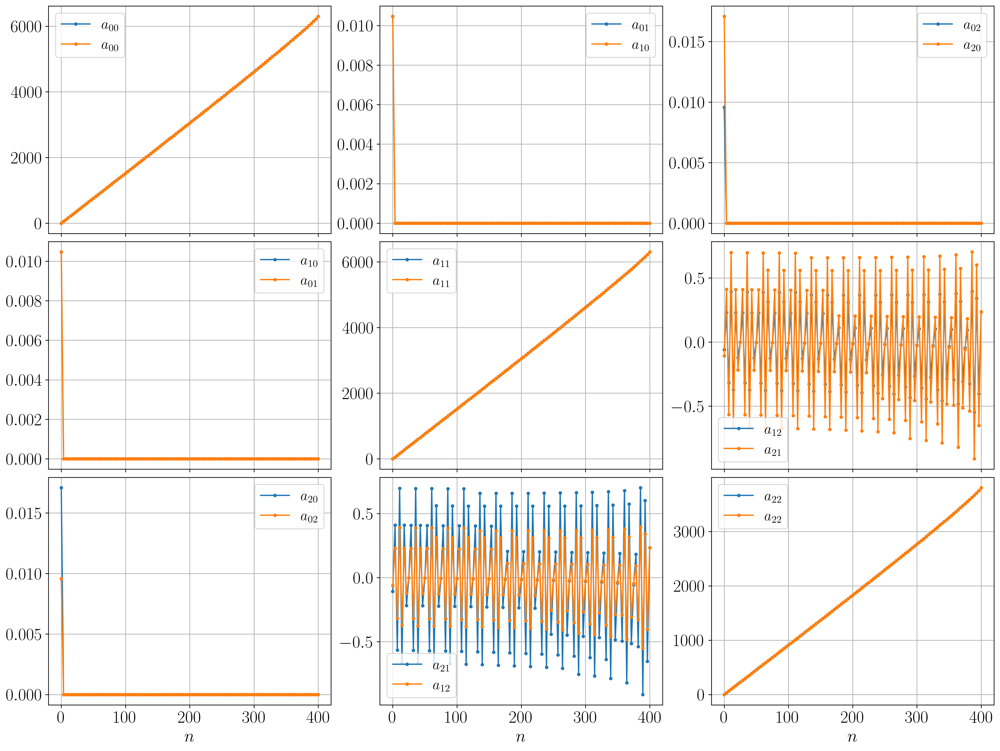

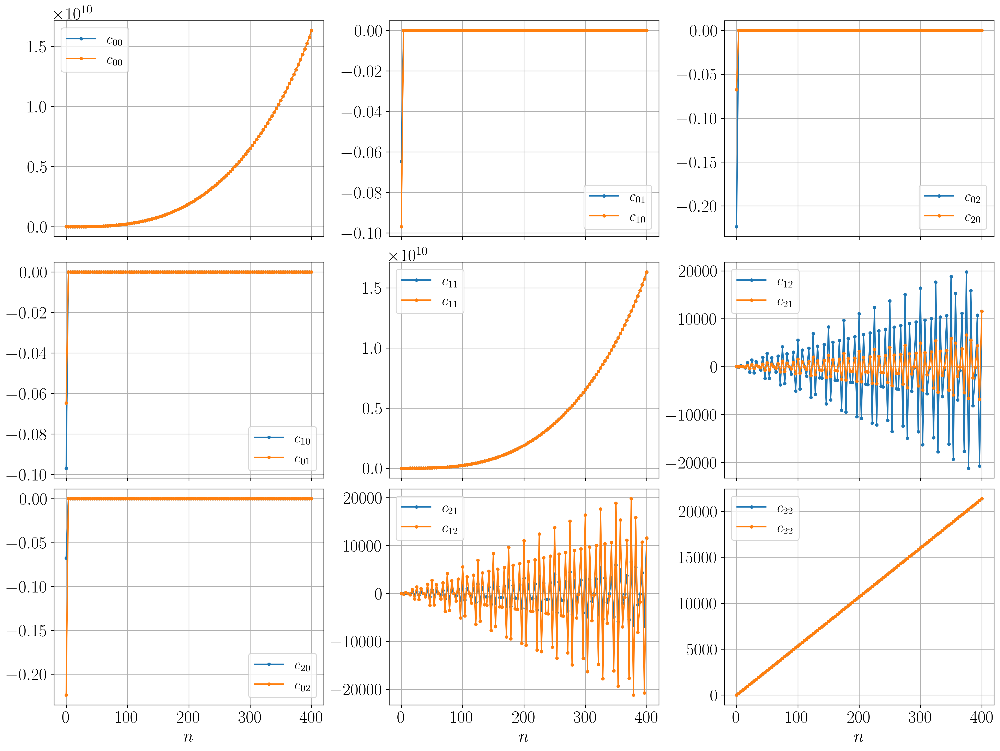

In [123]:
print(At)

fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
for t1 in range(3):
    for t2 in range(3):
        axi = axs[t1, t2]
        tinta1 = inta_ij[t1][t2]
        tinta2 = inta_ij[t2][t1]
        axi.plot(int_ch, tinta1, '.-', markevery=markevery, label='$a_{%d%d}$' % (t1, t2))
        axi.plot(int_ch, tinta2, '.-', markevery=markevery, label='$a_{%d%d}$' % (t2, t1))
        axi.legend(fontsize='small')
        axi.grid()
for t1 in range(3):
    axi = axs[-1, t1]
#     axi.set_xticks(np.arange(int_ch.max() + 0.1))
    axi.set_xlabel('$n$')
    
    
    
print(Ct)

fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True, sharex=True)
fig.patch.set_facecolor('white')
for t1 in range(3):
    for t2 in range(3):
        axi = axs[t1, t2]
        tintc1 = intc_ij[t1][t2]
        tintc2 = intc_ij[t2][t1]
        axi.plot(int_ch, tintc1, '.-', markevery=markevery, label='$c_{%d%d}$' % (t1, t2))
        axi.plot(int_ch, tintc2, '.-', markevery=markevery, label='$c_{%d%d}$' % (t2, t1))
        axi.legend(fontsize='small')
        axi.grid()
for t1 in range(3):
    axi = axs[-1, t1]
#     axi.set_xticks(np.arange(int_ch.max() + 0.1))
    axi.set_xlabel('$n$')


In [62]:
tA = np.vstack([i0[0].reshape((-1, 3)).sum(axis=0) * fgeo.get_deltaLength() 
                for i0 in f_tran_list]).T
print(tA)
print()
tB2 = np.vstack([np.cross(fgeo.get_nodes(), i0[0].reshape((-1, 3))).sum(axis=0) * fgeo.get_deltaLength() 
                 for i0 in f_tran_list]).T
print(tB2)
print()
tB1 = np.vstack([i0[0].reshape((-1, 3)).sum(axis=0) * fgeo.get_deltaLength() 
                 for i0 in f_rot_list]).T
print(tB1)
print()
tC = np.vstack([np.cross(fgeo.get_nodes(), i0[0].reshape((-1, 3))).sum(axis=0) * fgeo.get_deltaLength() 
                 for i0 in f_rot_list]).T
print(tC)
print()

[[ 1.36603e+02 -9.91137e-16 -3.13651e-16]
 [-5.08115e-16  1.36761e+02  3.93871e-01]
 [-3.01105e-16  3.93614e-01  9.69567e+01]]

[[ 1.62338e+01  4.81768e-13 -8.02947e-15]
 [ 3.72567e-13  2.10444e+00 -3.54257e+01]
 [-8.15493e-15  1.45994e+00 -2.56885e+01]]

[[ 1.61901e+01  1.67013e-13  1.26715e-14]
 [ 1.41319e-13  2.06024e+00  1.45794e+00]
 [-3.21179e-15 -3.53802e+01 -2.55361e+01]]

[[ 6.23424e+04  1.00047e-12 -1.28471e-14]
 [ 5.01039e-13  6.21725e+04  1.98748e+02]
 [ 8.35065e-14  1.98510e+02  2.72140e+02]]



In [110]:
print(Bt1)
print()
print(Bt2)
print()

tB2 = np.vstack([np.cross(fgeo.get_nodes(), i0[0].reshape((-1, 3))).sum(axis=0) * fgeo.get_deltaLength() 
                 for i0 in f_tran_list]).T
print(tB2)
print()
tB1 = np.vstack([i0[0].reshape((-1, 3)).sum(axis=0) * fgeo.get_deltaLength() 
                 for i0 in f_rot_list]).T
print(tB1)
print()

print(tB1 - Bt1)
print()
print(tB2 - Bt2)
print()

[[ 5.50905e+02  8.15908e-09 -1.64213e-12]
 [ 1.05388e-08 -9.00057e+01  1.17707e+00]
 [ 2.46132e-11 -1.51126e+03 -1.01875e+03]]

[[ 5.53002e+02  2.32690e-08 -1.53392e-10]
 [-9.96397e-09 -8.79083e+01 -1.51311e+03]
 [-3.28104e-12  1.17876e+00 -1.02493e+03]]

[[ 5.53002e+02 -2.17435e-09 -1.51442e-10]
 [-3.55609e-09 -8.79083e+01 -1.51311e+03]
 [-3.27113e-12  1.17876e+00 -1.02493e+03]]

[[ 5.50905e+02 -9.16567e-09 -1.63558e-12]
 [ 6.40631e-09 -9.00057e+01  1.17707e+00]
 [ 3.00623e-11 -1.51126e+03 -1.01875e+03]]

[[-1.93268e-12 -1.73247e-08  6.55337e-15]
 [-4.13246e-09 -3.26850e-13  8.88178e-15]
 [ 5.44913e-12 -5.45697e-12 -2.72848e-12]]

[[-3.41061e-13 -2.54433e-08  1.94978e-12]
 [ 6.40788e-09 -2.48690e-12 -6.82121e-13]
 [ 9.91219e-15 -1.59872e-14  2.95586e-12]]

